## Kiva Loan Funding - Data Wrangling

**PURPOSE**: Predict which microfinance loans will be funded

**STEPS:**
+ Data Import & Cleaning

**AUTHOR** : Maureen Wiebe

**DATA SOURCES**:<br> 
- Kiva Developer Tools: https://www.kiva.org/build/data-snapshots
    
**REV DATE**: 5-4-2021

In [1]:
import pandas as pd 
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
pd.set_option('max_columns', None)

### Data Import

Smaller dataset representing the last 6 months of 2019 was pickled from the original dataset.

In [55]:
loans_rand = pd.read_pickle('C:/Users/mwalz2/Documents/Python/Springboard/Kiva_Capstone_Project/data/interim/loans_rand.pkl')

In [3]:
#create pandas profiling report for loans2019
profile = ProfileReport(loans_rand, title='Loans Pandas Profiling Report', explorative = True)

profile

Summarize dataset:   0%|          | 0/48 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
loans_rand.head()

,LOAN_ID,LOAN_NAME,ORIGINAL_LANGUAGE,DESCRIPTION,DESCRIPTION_TRANSLATED,FUNDED_AMOUNT,LOAN_AMOUNT,STATUS,IMAGE_ID,VIDEO_ID,ACTIVITY_NAME,SECTOR_NAME,LOAN_USE,COUNTRY_CODE,COUNTRY_NAME,TOWN_NAME,CURRENCY_POLICY,CURRENCY_EXCHANGE_COVERAGE_RATE,CURRENCY,PARTNER_ID,POSTED_TIME,PLANNED_EXPIRATION_TIME,DISBURSE_TIME,RAISED_TIME,LENDER_TERM,NUM_LENDERS_TOTAL,NUM_JOURNAL_ENTRIES,NUM_BULK_ENTRIES,TAGS,BORROWER_NAMES,BORROWER_GENDERS,BORROWER_PICTURED,REPAYMENT_INTERVAL,DISTRIBUTION_MODEL
1033817,562653,Pedro Dimas,Spanish,"Pedro, solicita un nuevo préstamo por la neces...",Pedro’s asking for a new loan because he needs...,300.0,300.0,funded,820409.0,NaN,Agriculture,Agriculture,to buy farm supplies.,SV,El Salvador,NaN,standard,NaN,USD,167.0,2013-05-20 21:49:09+00:00,2013-06-21 18:10:08.000 +0000,2013-05-09 07:00:00.000 +0000,2013-05-22 23:41:55.000 +0000,14.0,8,2,1,NaN,Pedro Dimas,male,true,irregular,field_partner
679620,785807,Lusi,English,Meet Lusi. Lusi is married and she lives with ...,Meet Lusi. Lusi is married and she lives with ...,600.0,600.0,funded,1717380.0,NaN,Phone Use Sales,Retail,to provide mobile services in her community.,ID,Indonesia,Cianjur,shared,0.1,IDR,219.0,2014-10-20 10:25:48+00:00,2014-11-23 14:40:05.000 +0000,2014-09-21 07:00:00.000 +0000,2014-10-27 05:19:37.000 +0000,14.0,22,1,1,"#Low-profit FP, #Woman Owned Biz, #Parent",Lusi,female,true,bullet,field_partner
310280,596822,Juntas Podemos Group,Spanish,El grupo llamado Juntas Podemos está en su cic...,The group called Juntas Podemos [Together we C...,2250.0,2250.0,funded,1412450.0,NaN,Clothing,Clothing,to buy women's and children's clothing to sell.,PY,Paraguay,Mariano R. Alonso,standard,NaN,PYG,58.0,2013-08-17 04:20:27+00:00,2013-09-18 02:10:02.000 +0000,2013-07-17 07:00:00.000 +0000,2013-08-19 04:39:22.000 +0000,5.0,10,1,1,NaN,"Mirian, Mercedes, Valeria, Benita, Mayra, Marí...","female, female, female, female, female, female...","true, false, true, true, false, true, true, tr...",monthly,field_partner
261411,673431,Margarita,English,Margarita is 62 years old and widowed with eig...,Margarita is 62 years old and widowed with eig...,175.0,175.0,funded,1534784.0,NaN,Fruits & Vegetables,Food,to buy more fruits to sell to her customers,PH,Philippines,"Minglanilla, Cebu",shared,0.1,PHP,145.0,2014-02-20 07:28:53+00:00,2014-03-27 00:16:25.000 +0000,2014-02-04 08:00:00.000 +0000,2014-02-27 20:59:39.000 +0000,13.0,7,1,1,NaN,Margarita,female,true,monthly,field_partner
1630634,903404,Tapiwa Group,English,"Rachel, aged 38, is a member of the Tapiwa Gro...","Rachel, aged 38, is a member of the Tapiwa Gro...",2300.0,2300.0,funded,1907714.0,NaN,Cereals,Food,to increase the range of her catering business.,ZW,Zimbabwe,Harare,shared,0.1,USD,367.0,2015-06-17 13:08:01+00:00,2015-08-16 18:50:02.000 +0000,2015-06-15 07:00:00.000 +0000,2015-07-18 17:32:37.000 +0000,8.0,85,6,3,"#Woman Owned Biz, #Repeat Borrower, #Schooling...","Rachel, Nyarai, Emma, Nomzima, Angela","female, female, female, female, female","true, true, true, true, true",monthly,field_partner


In [5]:
loans_rand.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 110000 entries, 1033817 to 1016141
Data columns (total 34 columns):
 #   Column                           Non-Null Count   Dtype              
---  ------                           --------------   -----              
 0   LOAN_ID                          110000 non-null  int64              
 1   LOAN_NAME                        107439 non-null  object             
 2   ORIGINAL_LANGUAGE                107673 non-null  object             
 3   DESCRIPTION                      107673 non-null  object             
 4   DESCRIPTION_TRANSLATED           91685 non-null   object             
 5   FUNDED_AMOUNT                    110000 non-null  float64            
 6   LOAN_AMOUNT                      110000 non-null  float64            
 7   STATUS                           110000 non-null  object             
 8   IMAGE_ID                         107673 non-null  float64            
 9   VIDEO_ID                         46 non-null      fl

In [6]:
loans_rand.describe().round(2)

,LOAN_ID,FUNDED_AMOUNT,LOAN_AMOUNT,IMAGE_ID,VIDEO_ID,CURRENCY_EXCHANGE_COVERAGE_RATE,PARTNER_ID,LENDER_TERM,NUM_LENDERS_TOTAL,NUM_JOURNAL_ENTRIES,NUM_BULK_ENTRIES
count,110000.00,110000.00,110000.00,107673.00,46.00,96527.00,108786.00,110000.00,110000.00,110000.00,110000.00
mean,1083589.13,780.28,827.00,2150587.89,3090.48,0.11,175.31,13.38,21.19,1.51,1.12
std,472765.87,1056.50,1138.77,740894.70,537.23,0.03,101.37,7.68,27.06,0.98,0.46
min,262615.00,0.00,25.00,123422.00,2321.00,0.00,9.00,1.00,0.00,1.00,1.00
25%,674217.75,250.00,275.00,1540890.00,2675.00,0.10,123.00,8.00,7.00,1.00,1.00
50%,1083548.00,475.00,500.00,2207756.00,3016.50,0.10,145.00,13.00,13.00,1.00,1.00
75%,1492703.50,900.00,1000.00,2797024.00,3404.00,0.10,199.00,14.00,26.00,2.00,1.00
max,1904651.00,50000.00,100000.00,3348878.00,4337.00,0.20,596.00,146.00,1472.00,23.00,13.00


### Data Cleaning

#### Date Formatting 
Changed all of the date columns to date time format.

In [56]:
#change all of the date columns to datetime to allow for calculations
loans_rand['POSTED_TIME'] = pd.to_datetime(loans_rand['POSTED_TIME'] )
loans_rand['DISBURSE_TIME'] = pd.to_datetime(loans_rand['DISBURSE_TIME'] )
loans_rand['PLANNED_EXPIRATION_TIME']= pd.to_datetime(loans_rand['PLANNED_EXPIRATION_TIME'])
loans_rand['RAISED_TIME']= pd.to_datetime(loans_rand['RAISED_TIME'])

#### Missing Data

There are minimal missing values in the data besides the video_id field. This feature will be dropped.  The other two fields with higher degrees of "missing-ness" are currency exchange coverage rate and tags. The currency exchange rate is directly tired to the currency policy (shared or standard).  With standard there is no coverage rate and the field is therefore blank. The tag field is "tagging" the loan with certain characteristics and not every loan was tagged.  Both of these fields will be left as is. 

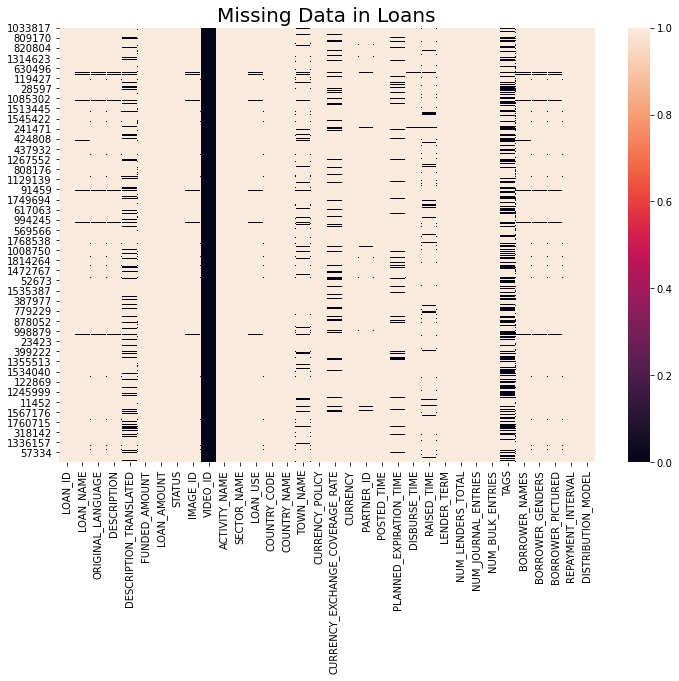

In [37]:
plt.subplots(figsize=(12,8))
sns.heatmap(~loans_rand.isna(),xticklabels = True)
plt.title("Missing Data in Loans",fontsize =20)
plt.show()

#### Video_Id

In [57]:
#drop video_id column 99% missing  

loans_rand.drop(['VIDEO_ID'], axis = 1, inplace = True)

#### Status 
The status column is the outcome variable we are looking to predict. It is a categorical variable indicating if the loan was funded or expired. There is one other value currently in the status column, refunded. Loans that are refunded are loans that the borrower returned to Kiva before using the funds. Key information is not included about these loans so they will be dropped from the dataset. 

In [39]:
loans_rand.STATUS.value_counts()

funded      103442
expired       6192
refunded       366
Name: STATUS, dtype: int64

In [58]:
#remove all rows with status = refunded; 366 loans 

loans_rand.drop(loans_rand[loans_rand.STATUS =='refunded'].index, inplace = True)

#### Image ID 
Every loan has an associated image since no additional information can be gained by the ID of the image this column will be dropped.

In [59]:
loans_rand.drop(['IMAGE_ID'], axis = 1, inplace = True)

### Individual Features 

The Pandas Profile report was used to explore each feature.  

1. The loan amount for the vast majority of loans is < \\$900 but there are loan outliers up to $100,000 causing a skewed distribution.  

2. The loans are posted in 15 different sectors that contain 163 distinct activities to further segregate them. 

3. Over 25% of the loans are made to borrowers in the Phillipines. There are 65 additional unique countries where borrowers recieved loans. 

4. There are two different currency exchange policies.  Shared: the Field Partner takes on risk associated with currency fluctuations and is responsible for the first X% of currency losses(X is defined in the currency exchange coverage rate). Standard: all risk is shared and any currency exchange losses are covered by ALL lenders.  

5. There is one field partner (145 - Philippines Negro Women for Tomorrow Foundation ) that accounts for 20%+ of all the loans made. 

6. The lender terms for the vast majority of loans is < 14 months but there are outliers up to 140 months casusing a skewed distribution.  

7. The number of lenders per loan seems to relate to the size of the loan. Lenders can lend in increments of $25 and it is uncommon for a single lender to fund an entire loan.  

8. There are three different ways that loans can be repaid.  The most common is monthly.  The other two options are bullet: one-time lump payment or irregular: payments are not made at regular intervals by lender is still tied to the overall lending terms. 

9. There are two different ways that loans are distributed. Less than 0.05% of loans are "direct" meaning the funds are distributed directly from Kiva to the borrower.  The vast majority of loans go through a Field Partner which is an organization on the ground that connects individual borrowers with the Kiva platform and disburses the loan.  


In [14]:
#create pandas profiling report for loans2019
profile = ProfileReport(loans_rand, title='Loans Pandas Profiling Report', explorative = True)

profile

Summarize dataset:   0%|          | 0/46 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### New Features
To provide more information during the analysis phase additional information will be added based on exisiting information.   

#### Total Borrowers per Loan

In [60]:
#create list that contains number of borrowers by counting the number of names associated with each loan
borrower_list = loans_rand['BORROWER_NAMES'].str.split(',')
NUM_BORROWERS_TOTAL =[]
for i, value in borrower_list.items(): 
    if isinstance(value, list):
        NUM_BORROWERS_TOTAL.append(len(value))
    else: 
        NUM_BORROWERS_TOTAL.append(1)

In [61]:
#insert number of borrowers into the loans_rand dataframe
loans_rand.insert(27,'NUM_BORROWERS_TOTAL',list(NUM_BORROWERS_TOTAL))

#### Borrower(s)'s Gender

In [62]:
#insert column to identify if any male borrowers are part of the loan into loans_rand dataframe
loans_rand.insert(30,'FEMALE_ONLY_LOAN', 1)

#identify any loans that include males 
indices = loans_rand[(loans_rand.BORROWER_GENDERS.notna()) & (loans_rand.BORROWER_GENDERS.str.contains(".*female.*\\bmale.*"))| (loans_rand.BORROWER_GENDERS =='male')].index

#update column to identify loans including males 
loans_rand.loc[indices,'FEMALE_ONLY_LOAN'] =0

#### Loan Tags 
Individual loans are given "hashtags" indicating relevant information that might appeal to a lender like: "woman owned business" or "first time loan".   These tags were all located in a single field and so will be parsed out to further categorize each loan.

In [63]:
#Identify the most common tags 
loan_tags = loans_rand['TAGS'].str.split('#|,')
TAGS_DICT ={}
for i, tags in loan_tags.items():
    if isinstance(tags, list):
        for tag in tags: 
            if tag.strip() in TAGS_DICT:
                TAGS_DICT[tag.strip()] += 1
            else:
                TAGS_DICT[tag.strip()] = 1
del TAGS_DICT['']

In [64]:
#replace all Nan values with empty list to allow for looping
indices = loan_tags[loan_tags.isna()].index
loan_tags[indices]=loan_tags[indices].apply(lambda d: d if isinstance(d, list) else [])

#remove all whitespaces from tags
for i, tags in loan_tags.items():
    loan_tags[i] = [tag.strip() for tag in tags]

In [65]:
#create dataframe with columns corresponding to tags 
tag_df = pd.DataFrame()
column_names = []
tag_present = []

for key in TAGS_DICT.keys():
    column_names.append('Tag_'+key)
    for i, tags in loan_tags.items():
        if (key in tags):
            tag_present.append(1)
        else: 
            tag_present.append(0)
    tag_df['Tag_'+key] = tag_present
    tag_present = []

In [72]:
#merge dataframe with tag columns to original dataframe 

loans_rand = pd.concat([loans_rand.reset_index(drop =True), tag_df], axis=1, join = "inner") 

#### Loan Description - Activity Name
Each loan is categorized into a sector (Food, Clothing, etc.).  The loan is then subcategorized into an activity.  A food loan could be subcategorized into Bakery or Catering for example.  There is even more specific information given in the Loan Use column but this is distinct for each loan.  To allow for more granular understanding the loan activities will be expanded out.  

In [73]:
#Create dummy variables for all of the activities names 

dummies = pd.get_dummies(loans_rand.ACTIVITY_NAME, drop_first=True).rename(columns=lambda x: 'Activity_' + str(x))

loans_rand = pd.concat([loans_rand, dummies], axis=1)

#### Loan Status  

In [74]:
#Create dummy variable for the STATUS column
dummies = pd.get_dummies(loans_rand.STATUS, drop_first=True).rename(columns=lambda x: 'Status_' + str(x))

loans_rand = pd.concat([loans_rand, dummies], axis=1)

#### Average Amount Loaned per Lender

In [75]:
#add another column that calculates the average amount each lender put towards the loan 
loans_rand['AVG_LENDER_AMT'] = round(loans_rand.FUNDED_AMOUNT/loans_rand.NUM_LENDERS_TOTAL,0)

#### Time to Fund Loan

In [76]:
#Add column that calculates the number of hours that it took to get a loan funded 
loans_rand.insert(23,'RAISED_HOURS',round(pd.to_timedelta(loans_rand.RAISED_TIME - loans_rand.POSTED_TIME)/ pd.Timedelta('1 hour'),2))

#### Funded Percent (Expired Loans)

In [77]:
#add column that calculates what % the loan was funded (i.e. if expired how close was it to reaching funding)

loans_rand.insert(7,'FUNDED_PERCENT', round(loans_rand.FUNDED_AMOUNT/loans_rand.LOAN_AMOUNT,2))


#### Currency Policy & Currency Exchange Rate 
Kiva has established two different options for their field partners to manage the fluctuations in exchange rates. The first policy is a shared model where the Field Partner takes on risk associated with currency fluctuations and is responsible for the first 10% of currency losses. The second model called the standard model is setup where all risk is shared and any currency exchange losses are covered by ALL lenders rather than the field partners bearing the responsibility. This is not clearly distinguished based on the combination of the currency policy and currency exchange rate features.  A new column that combines the information from these two columns will be added.  

In [78]:
loans_rand.insert(17,'CURRENCY_EXCHANGE_RATE_CALC', loans_rand.CURRENCY_EXCHANGE_COVERAGE_RATE)

In [79]:
loans_rand.CURRENCY_EXCHANGE_RATE_CALC.fillna(0,inplace =True)

#### Seasonality 
There appeared to be seasonality in the 2019 dataset that impacts the liklihood funding of the loan.   A column will be added to indicate the month which will be used to tease out this trend in our random set.  

In [80]:
loans_rand.insert(20,'MONTH', loans_rand.POSTED_TIME.dt.month)

In [84]:
month = pd.DataFrame(loans_rand.pivot_table(index =['MONTH'], columns ='STATUS', values ='POSTED_TIME', aggfunc ='count', fill_value =0).to_records())
month['PERCENT_FUNDED']=month.funded/(month.funded + month.expired)
month

,MONTH,expired,funded,PERCENT_FUNDED
0,1,431,7740,0.947252
1,2,194,8061,0.976499
2,3,357,9141,0.962413
3,4,551,8178,0.936877
4,5,759,8773,0.920373
5,6,623,8431,0.931191
6,7,711,8764,0.924960
7,8,512,8511,0.943256
8,9,574,8712,0.938187
9,10,632,9219,0.935844


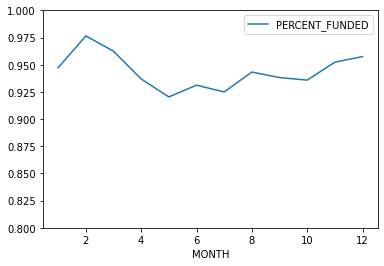

In [91]:
month.plot(x='MONTH', y='PERCENT_FUNDED')
plt.ylim(0.8,1)
plt.show()

This chart seems to indicate that the trend is not consistent when looking at a sample of the overall dataset. 

## Save Cleaned Data

In [81]:
loans_rand.to_pickle('C:/Users/mwalz2/Documents/Python/Springboard/Kiva_Capstone_Project/data/interim/loans_rand_clean.pkl')